# Car Sales

Questo dataset si basa sulle vendite di auto che include informazioni su diversi concessionari di vendita di auto e il modello delle auto vendute in diverse regioni degli Stati Uniti ed é reperibile al seguente link:
https://www.kaggle.com/datasets/sachinsachin/car-sales

## Importazioni dei dati e delle librerie necessarie per l'analisi

In [1]:
import numpy as np
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

df = pd.read_csv("Car Sales.CSV",sep=';')

### Sistemazione date

In [2]:
df["Date"] = pd.to_datetime(df["Date"],format="%d.%m.%Y")

# **1. Analisi del prezzo in relazione con il reddito annuale**
## 1.1 Distribuzione del prezzo delle auto

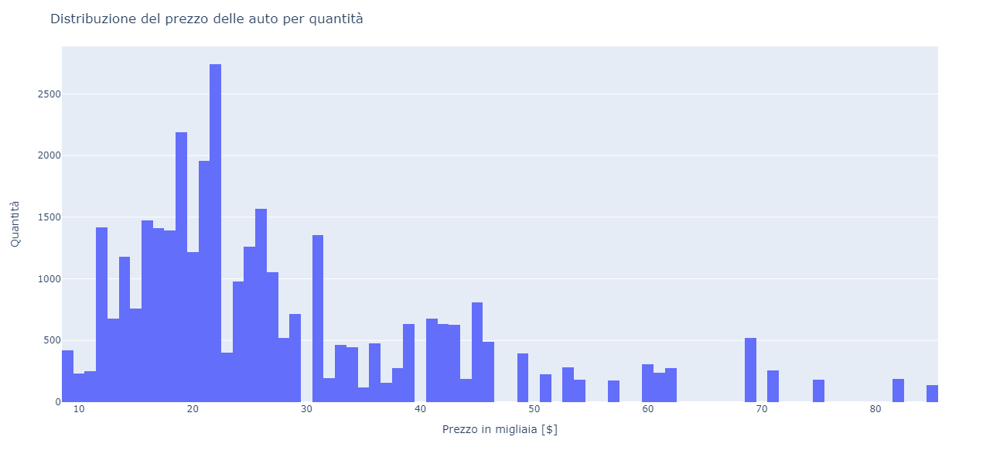

In [3]:
fig = px.histogram(data_frame = df, x = "Price in thousands")

fig.update_layout(
    title="Distribuzione del prezzo delle auto per quantità",
    xaxis=dict(title="Prezzo in migliaia [$]"),
    yaxis=dict(title="Quantità"),
    width=1000,
    height=600,
)

fig.show()

## 1.2 Distribuzione del reddito annuale

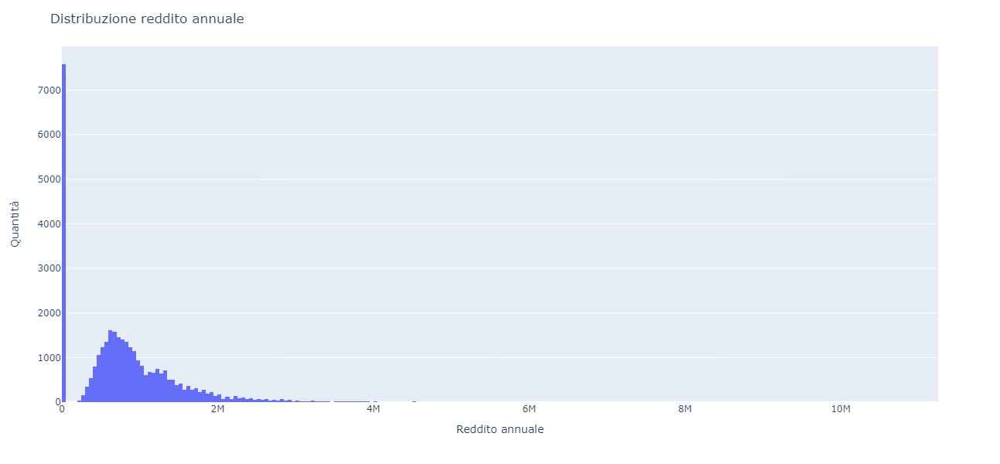

In [4]:
fig = px.histogram(data_frame = df, x = "Annual Income")

fig.update_layout(
    title="Distribuzione reddito annuale",
    yaxis=dict(title="Quantità"),
    xaxis=dict(title="Reddito annuale"),
    width=1000,
    height=600,
)

fig.show()

## 1.3 Analisi del rapporto tra il prezzo e il reddito annuale

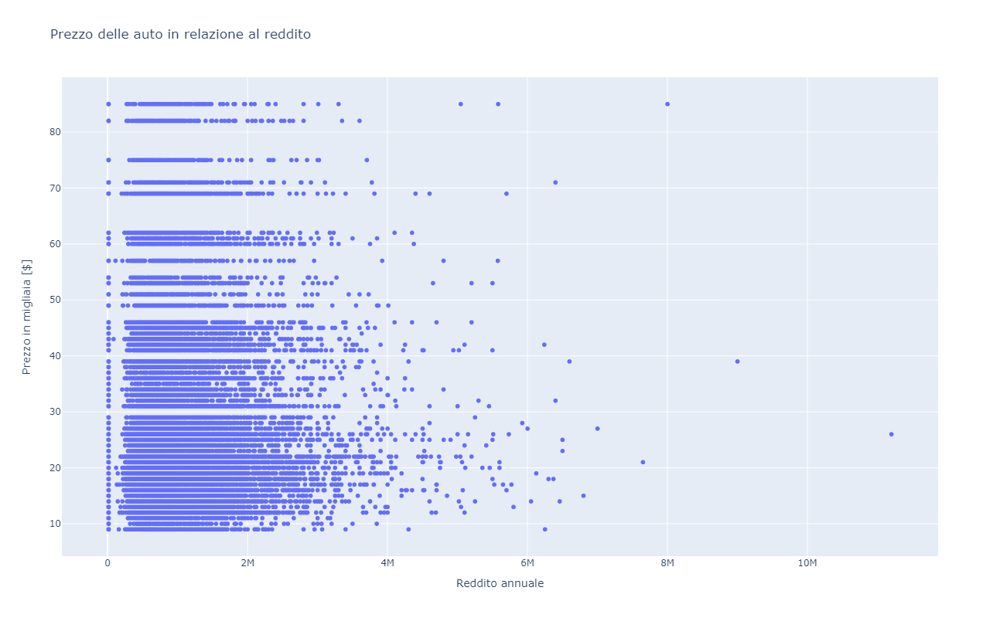

In [6]:
fig = px.scatter(df,
                   x= "Annual Income",
                   y= "Price in thousands",
                 title="Prezzo delle auto in relazione al reddito",
                  )

fig.update_layout(
    yaxis=dict(title="Prezzo in migliaia [$]"),
    xaxis=dict(title="Reddito annuale"),
    width=1000,
    height=800,
)

fig.show()

## 1.4 Commento

Si puo' osservare che tra il reddito annuale e il prezzo non c'e una relazione, infatti questa e' stata verificata nuovamente calcolando il coefficiente di correlazione che era pari a 0, il che conferma che non esiste una relazione lineare tra le due variabili.

# **2. Analisi del reddito massimo basato su 10 marche automobilistiche**

Le 10 marche su cui si lavora sono: Ford, Toyota, Mitsubishi, Volkswagen, BMW, Nissan, Hyundai, Porsche, Mercedes-B, Audi. L'analisi é voluta svolgersi sul massimo reddito, poiché analizzando il reddito medio o il reddito minimo risultavano poche differenze se non nulle.

## 2.1 Preparazione strumenti di analisi

### 2.1.1 Raggruppamento dei dati inerenti alle 10 marche

In [7]:
df_marche = df[(df["Company"] == "Ford") | (df["Company"]=="Toyota")
                    | (df["Company"]=="Mitsubishi") | (df["Company"]=="Volkswagen")
                    | (df["Company"]=="BMW") | (df["Company"]=="Nissan")
                    | (df["Company"]=="Hyundai") | (df["Company"]=="Porsche")
                    | (df["Company"]=="Mercedes-B") | (df["Company"]=="Audi")]

### 2.1.2 Ordinamento per marchio

In [8]:
df_marche = df_marche.sort_values(by=["Company"])

### 2.1.3 Raggruppamento dei redditi in base al marchio e ordinamento in base al massimo reddito

In [9]:
df_reddito_marchio = df_marche["Annual Income"].groupby(df_marche["Company"]).max().sort_values(ascending=False)

### 2.1.4 Ordinamento degli indici

In [10]:
df_reddito_marchio = df_reddito_marchio.sort_index()

### 2.1.5 Salvataggio dei dati

In [11]:
valori = df_reddito_marchio.values
indici = df_reddito_marchio.index

## 2.2 Distribuzione del reddito annuale

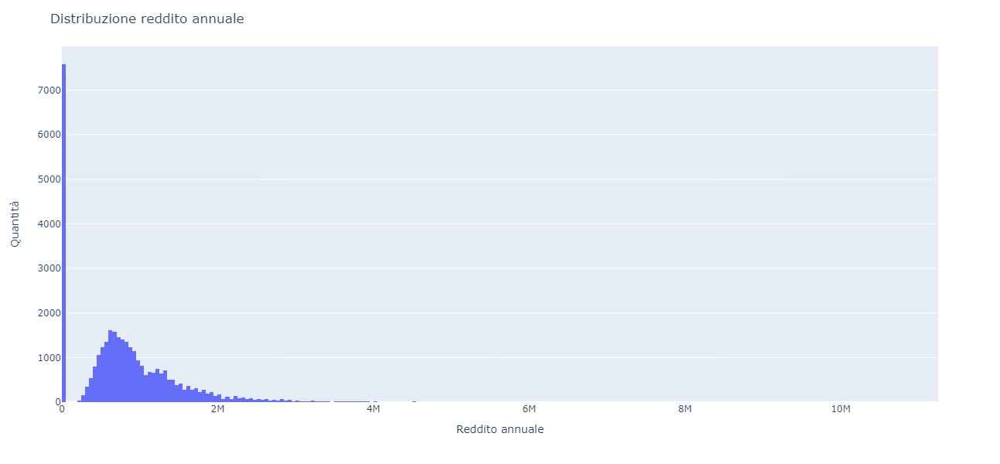

In [12]:
fig = px.histogram(data_frame = df, x = "Annual Income")

fig.update_layout(
    title="Distribuzione reddito annuale",
    yaxis=dict(title="Quantità"),
    xaxis=dict(title="Reddito annuale"),
    width=1000,
    height=600,
)

fig.show()

## 2.3 Distribuzione delle 10 marche

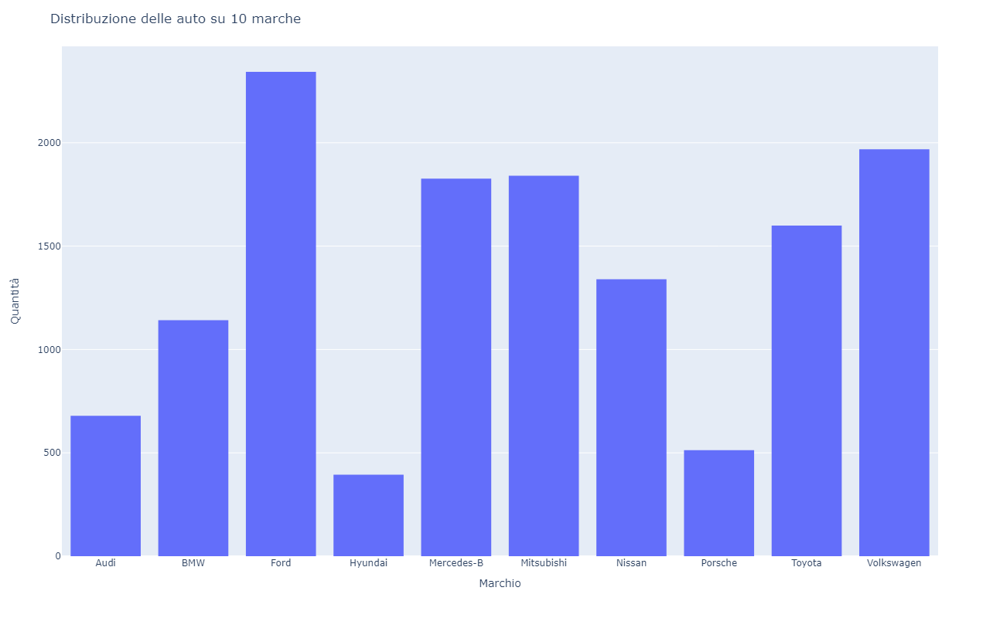

In [13]:
fig = px.histogram(df_marche,
                   x= "Company",
                  )

fig.update_layout(
    title="Distribuzione delle auto su 10 marche",
    yaxis=dict(title="Quantità"),
    xaxis=dict(title="Marchio", categoryorder='category ascending'),
    width=1000,
    height=800,
)

fig.show()

## 2.4 Analisi

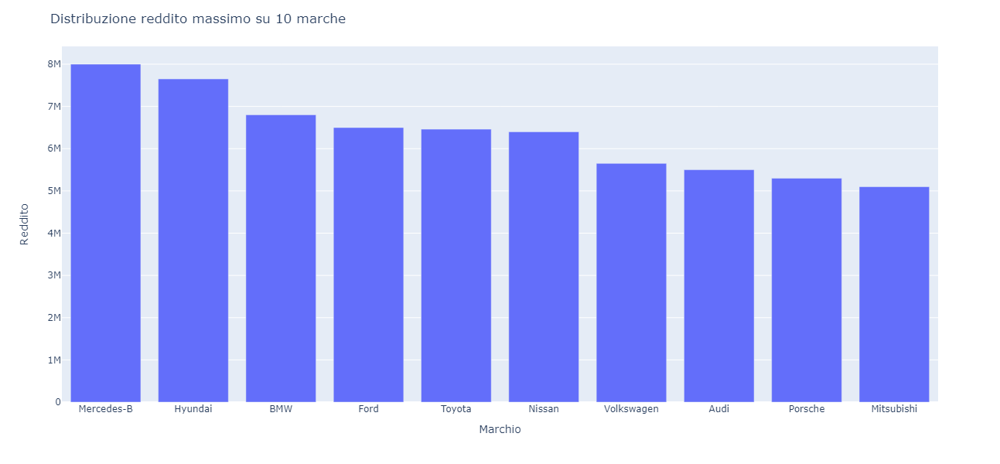

In [14]:
fig = px.bar(x=indici,y=valori)

fig.update_layout(
    title="Distribuzione reddito massimo su 10 marche",
    xaxis=dict(title="Marchio",categoryorder='total descending'),
    yaxis=dict(title="Reddito"),
    width=1000,
    height=600,
)

fig.show()

## 2.5 Commento

Si vede dal grafico che il marchio predominante é Mercedes-B, un marchio Europeo. Inoltre si nota che alcuni marchi risultano meno acquistati rispetto al reddito, quando invece ci si aspetta il contrario, per esempio: Porsche, Audi, Volkswagen; quando invece si tende ad andare versi altri marchi come: Hyundai, BMW, Ford.

# **3. Analisi di auto nuove e d'occasione basate su 10 marche automobilistiche**

Le 10 marche su cui si lavora sono: Ford, Toyota, Mitsubishi, Volkswagen, BMW, Nissan, Hyundai, Porsche, Mercedes-B, Audi.

## 3.1 Preparazione strumenti di analisi
### 3.1.1 Creazione colonna con condizione basata sulle date di vendita e l'anno della vettura

In [15]:
df["Tipologia di auto"] = np.where(df["Date"].dt.year == df["Year"],"NUOVA","USATA")

### 3.1.2 Raggruppamento dei dati inerenti alle 10 marche

In [16]:
df_marche_usate_nuove = df.copy(deep=True)

df_marche_usate_nuove = df_marche_usate_nuove[(df_marche_usate_nuove["Company"] == "Ford") | (df_marche_usate_nuove["Company"]=="Toyota")
                    | (df_marche_usate_nuove["Company"]=="Mitsubishi") | (df_marche_usate_nuove["Company"]=="Volkswagen")
                    | (df_marche_usate_nuove["Company"]=="BMW") | (df_marche_usate_nuove["Company"]=="Nissan")
                    | (df_marche_usate_nuove["Company"]=="Hyundai") | (df_marche_usate_nuove["Company"]=="Porsche")
                    | (df_marche_usate_nuove["Company"]=="Mercedes-B") | (df_marche_usate_nuove["Company"]=="Audi")]


### 3.1.3 Ordinamento in base al marchio

In [17]:
df_marche_usate_nuove = df_marche_usate_nuove.sort_values(by=["Company"])

## 3.2 Distribuzione delle 10 marche

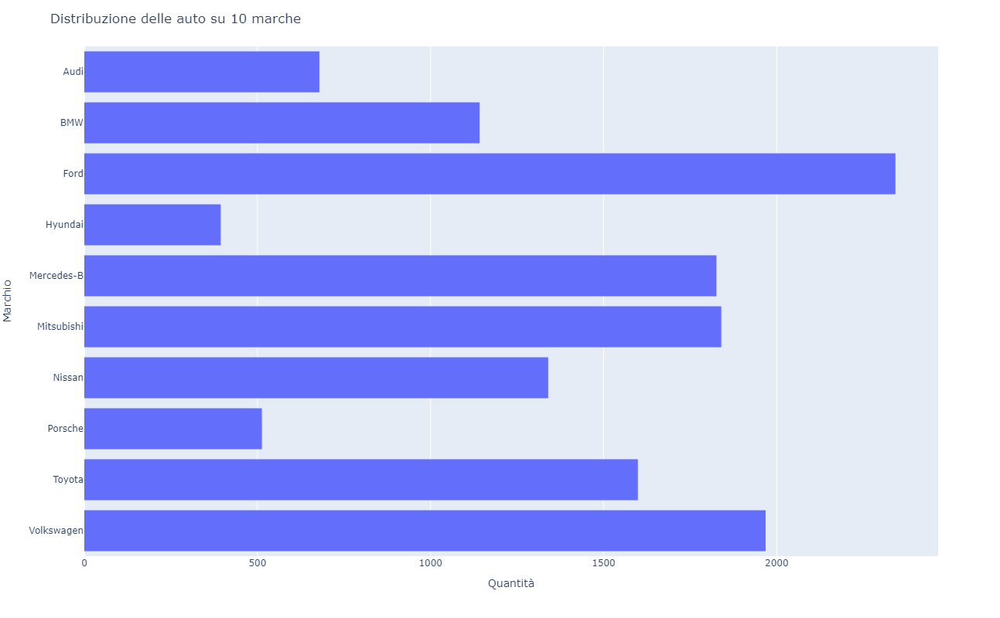

In [18]:
fig = px.histogram(df_marche_usate_nuove,
                   y= "Company",
                   orientation="h",
                  )

fig.update_layout(
    title="Distribuzione delle auto su 10 marche",
    xaxis=dict(title="Quantità"),
    yaxis=dict(title="Marchio", categoryorder='category descending'),
    width=1000,
    height=800,
)

fig.show()

## 3.3 Analisi

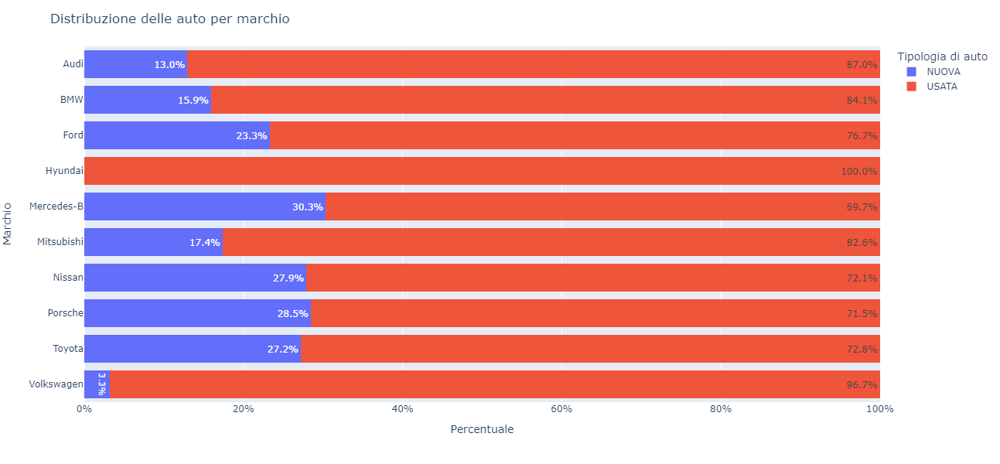

In [19]:
fig = px.histogram(df_marche_usate_nuove,
                   y= "Company",
                   color = "Tipologia di auto",
                   orientation="h",
                   barmode="stack",
                  barnorm="percent")

fig.update_layout(
    title="Distribuzione delle auto per marchio",
    legend_title="Tipologia di auto",
    xaxis=dict(title="Percentuale", ticksuffix="%"),
    yaxis=dict(title="Marchio", type='category', categoryorder='category descending'),
    width=1000,
    height=600,

)

fig.update_traces(textposition="inside", texttemplate= "%{x:.1f}%")
fig.show()

## 3.4 Commento

Si nota che per quanto riguarda la hyundai domina la tendenza a comprare un'auto d'occasione e mentre per la Volkswagen si ha una percentuale molto bassa rispetto agli altri marchi.

# **4. Analisi del prezzo basata su 10 marche automobilistiche**

Le 10 marche su cui si lavora sono: Ford, Toyota, Mitsubishi, Volkswagen, BMW, Nissan, Hyundai, Porsche, Mercedes-B, Audi.

## 4.1 Analisi

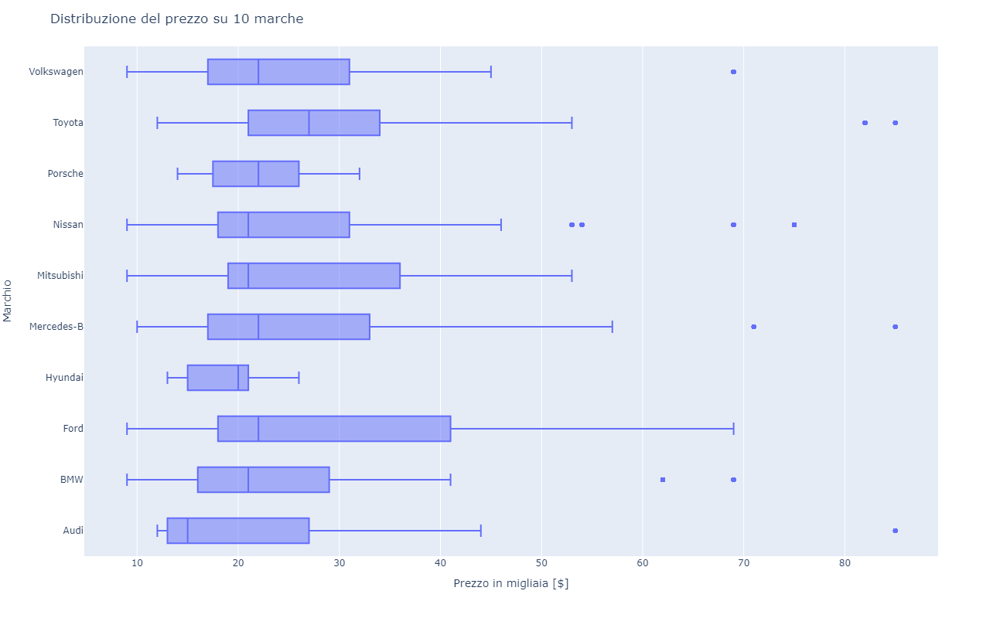

In [20]:
fig = px.box(df_marche, orientation="h", y="Company", x="Price in thousands")

fig.update_layout(
    title="Distribuzione del prezzo su 10 marche",
    yaxis=dict(title="Marchio"),
    xaxis=dict(title="Prezzo in migliaia [$]"),
    width=1000,
    height=800,
)

fig.show()

## 4.2 Commento

Si puo' notare che i dati sono asimmetrici e che sono tendenti al 25° percentile. Ci sono alcuni casi fuori dal range iterquartile dei box che possono essere dovuti a errori o possibile natura insolita. Inoltre Hyundai e Porsche hanno un range molto inferiore rispetti agli altri.

# **5. Analisi della vendita di auto nuove da parte dei concessionari sulle diverse marche**

L'analisi é centrata sull'avere un'idea della distribuzione di auto nuove di alcune marche sui concessionari, ciò non implica dover visualizzare ogni singolo marchio.

## 5.1 Preparazione strumenti di analisi
### 5.1.1 Raggruppamento dati delle auto nuove

In [21]:
df_auto_nuove = df[(df["Date"].dt.year == df["Year"])]

### 5.1.2 Raggruppamento il numero di auto di ogni marchio per ogni concessionario

In [22]:
t_raccolta = df_auto_nuove.groupby(["Dealer_Name","Company"]).size().unstack(fill_value=0)

## 5.2 Distribuzione delle marche sulle auto nuove

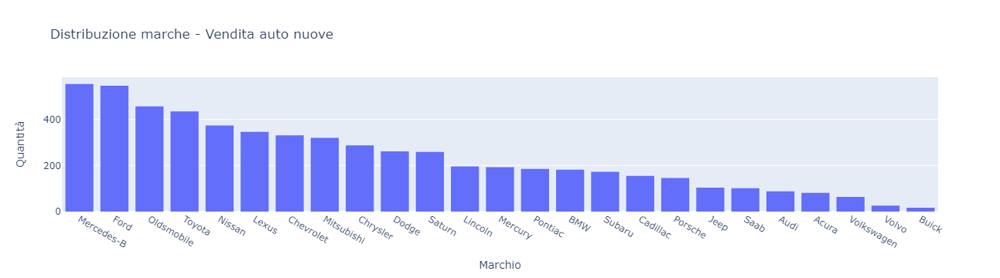

In [23]:
fig = px.histogram(data_frame = df_auto_nuove, x = df_auto_nuove["Company"], title="Distribuzione marche - Vendita auto nuove")
fig.layout["xaxis"]["title"] = "Marchio"
fig.layout["yaxis"]["title"] = "Quantità"

fig.update_layout(
    xaxis=dict(categoryorder='total descending'),
)

fig.show()

## 5.3 Analisi

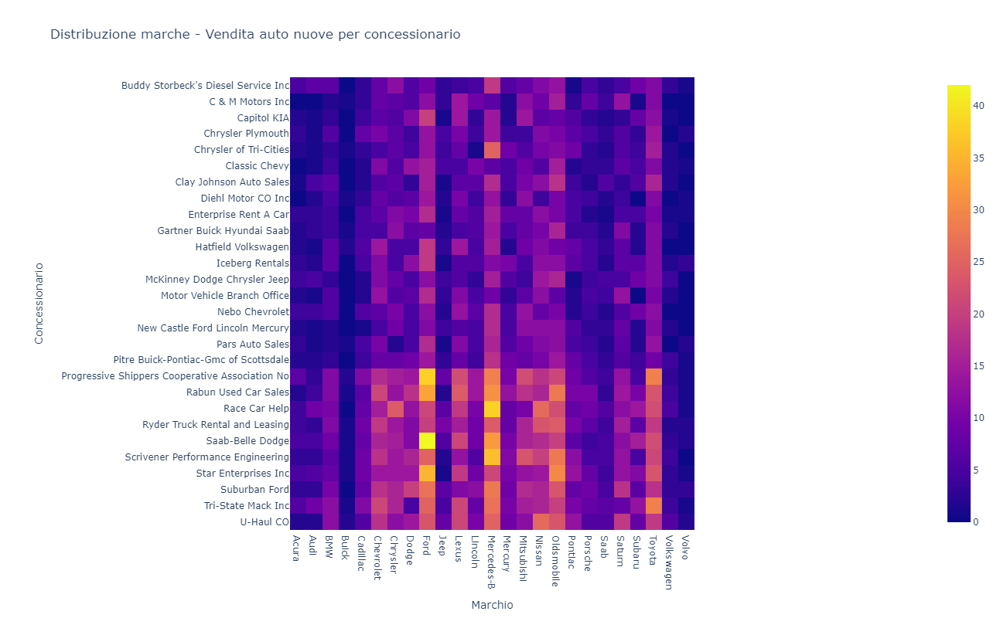

In [24]:
fig = px.imshow(t_raccolta,width=1000, height=800, title = "Distribuzione marche - Vendita auto nuove per concessionario")

fig.update_layout(
    legend_title="Quantità",
    xaxis=dict(title="Marchio"),
    yaxis=dict(title="Concessionario"),
)

fig.show()

## 5.4 Commento

Si puo' notare maggiore concentrazione da parte dei ultimi 10 concessionari, dove c'é una tendenza ai marchi europei.

# **6. Analisi della vendita di auto d'occasione da parte dei concessionari sulle diverse marche**

L'analisi é centrata sull'avere un'idea della distribuzione di auto d'occasione di alcune marche sui concessionari, ciò non implica dover visualizzare ogni singolo marchio.

## 6.1 Preparazione strumenti di analisi
### 6.1.2 Raggruppamento dati delle auto d'occasione

In [25]:
df_auto_occasione = df[(df["Date"].dt.year != df["Year"])]

### 6.1.3 Raggruppamento il numero di auto di ogni marchio per ogni concessionario

In [26]:
tx_raccolta = df_auto_occasione.groupby(["Dealer_Name","Company"]).size().unstack(fill_value=0)

## 6.2 Distribuzione delle marche sulle auto d'occasione

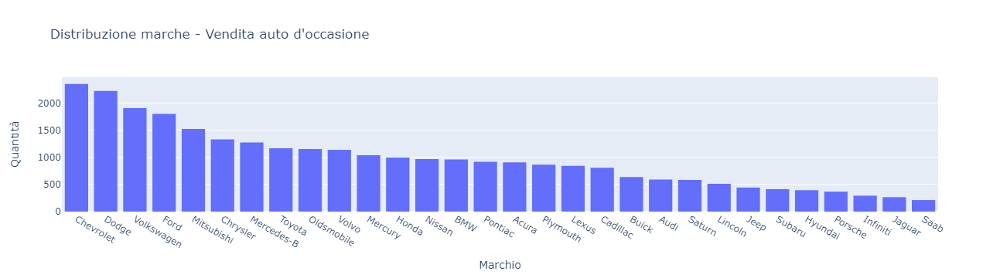

In [27]:
fig = px.histogram(data_frame = df_auto_occasione, x = df_auto_occasione["Company"], title="Distribuzione marche - Vendita auto d'occasione")

fig.layout["xaxis"]["title"] = "Marchio"
fig.layout["yaxis"]["title"] = "Quantità"

fig.update_layout(
    xaxis=dict(categoryorder='total descending'),
)
fig.show()

## 6.3 Analisi

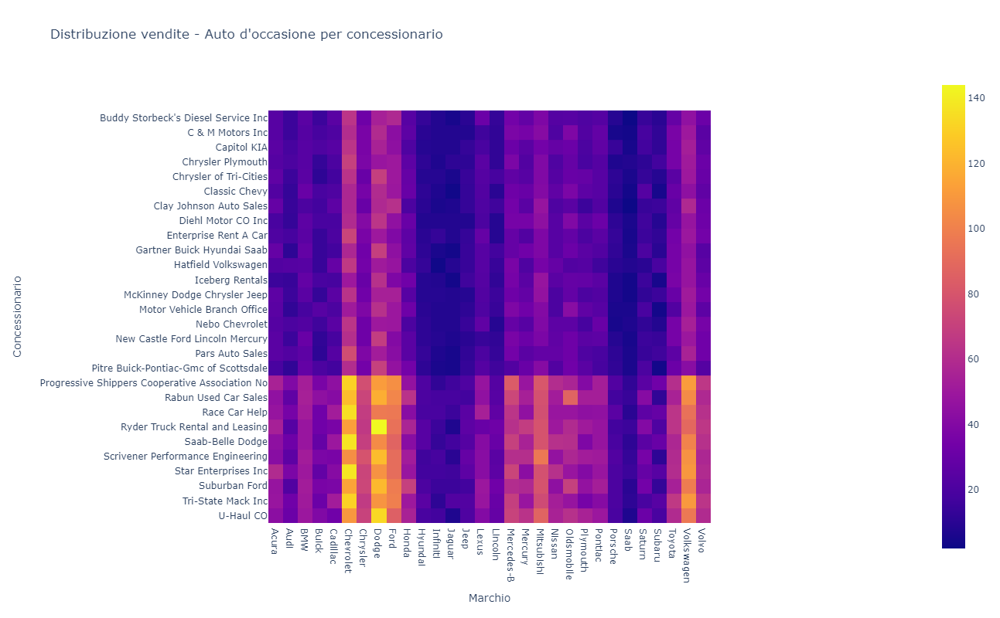

In [28]:
fig = px.imshow(tx_raccolta,width=1000, height=800, title = "Distribuzione vendite - Auto d'occasione per concessionario")

fig.update_layout(
    legend_title="Quantità",
    xaxis=dict(title="Marchio"),
    yaxis=dict(title="Concessionario"),
)

fig.show()


## 6.4 Commento

Si puo' notare maggiore concentrazione da parte dei ultimi 10 concessionari, dove c'é una tendenza ai marchi americani.